# Loan Repayment Risk Model Creation 
    Author: Brandon Tan 
    Date: 5/9/2022
    Time Spent: 20 hours
## Table of Content 
>1.	Introduction (Business Problem) 
>2.	Project Goals and Objectives 
>3. Approach / Steps taken to solve the problem
>4.	Loan Repayment Risk Model
       - Import Libraries
       - Data Preprocessing  
       - Feature Analysis / Selection 
             - Filter Method 
             - Heatmap Correlation 
       - Model Creation
             - Data Transformation and Splitting 
             - Model Training Non- Smote / Kfold
             - Model Training Smote / Kfold
>5.	ML Model Impact On Business Objective Discussion (Summary)
>6. Further Improvement 
>7.	Appendix 
        - Tools /Libraries/ Technique used 
        - Data Usage

## Introduction / Business Problem 
> Money Lion is a Fintech company whose goal is to offer consumers a one-stop all-access app for their banking / financial needs. The company offers a variety of financial services to consumers and one of its core services is providing loans to consumers with a low-interest rate. Like all financial institutes in the loan business, the risk of loan repayment is imminent, however, with the power of Data Science, we can get an edge by anticipating whether a person is going to default on their loan repayment.  



## Project Goals and Objectives 
> The objective is to create a machine learning model that is highly effective in predicting loan risk on a given candidate. The goal is to mitigate potential losses by applicants whose loans might default.

## Approach / Steps taken to solve the problem
 **STEPS**
    1. For every problem before we began creating our model, we first start by understanding our data. By understanding what each column represents we develop an idea process flow on how we want to engineer our data and what final information to feed our model for prediction. 
    
    2. After getting a good idea of what our data portrays, we start massaging and cleaning the data to weed out information that is not relevant to our analysis and model creation. 
   
    3. When our data is finally cleaned, we select and experiment with different Machine Learning algorithms that best suit our domain and use case. 
    
    4. After our model is created, we evaluated its performance by the appropriate metrics that suit our use case. 
    
    5. Finally we save our model and deploy it for production and record its efficiency in real-life data / scenarios. 
 

## Loan Repayment Risk Model
>For Loan Repayment Risk Model we will use the **Loan Data** & **Clarity Underwritting Variable Data** for our model creation. We will only select candidates whose loans have been **Funded**. 

>Our Y Label would be based on 4 unique values in loanStatus 'Paid Off Loan', 'Charged Off', 'Settled Bankruptcy' and 'Settlement Paid Off'. 
          - 'Paid Off Loan' and 'Settlement Paid Off' are indicators that candidates could repay the loan amount and would be encoded to 1.
          - 'Charged Off', 'Settled Bankruptcy' are indicators that candidates could not repay the loan amount and would be encoded to 0.
          
>Our X Label would include most of the features of a candidate found in **Loan Data** & **Clarity Underwritting Variable Data** as we are trying to predict the likelihood of a candidate paying off based on certain features and characteristics. 

> Model Creation Sequence:
           - Data Preprocessing  
           - Feature Analysis / Selection with Statistics
           - Data Transformation and Splitting 
           - ML Model (Classification) 
           - Model Evaluation & Comparison 

### Import Libraries

In [2]:
# Import all libraries
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt 
import seaborn as sns
import hvplot.pandas
import warnings

### Data Preprocessing 



In [120]:
# Read CSV File
loan_df = pd.read_csv('data/loan.csv')
payment_df = pd.read_csv('data/payment.csv')
clarity_u_df = pd.read_csv('data/clarity_underwriting_variables..csv')

C:\Users\Boss\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3331: DtypeWarning: Columns (9,11,12,13,14,15,16,17,18,19,20,21,22,24,25,26,28,29,32,33) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [121]:
# Filter loan_df by only Funded and Y labels listed above
loan_df = loan_df.loc[(loan_df['isFunded'] ==1)]
loan_df = loan_df.loc[loan_df['loanStatus'].isin(['Paid Off Loan' ,'Charged Off','Settled Bankruptcy','Settlement Paid Off'])]

In [122]:
# Left Join Loan.csv with Clarity Underwritting Variable
loan_df = loan_df.merge(clarity_u_df, 
                    left_on='clarityFraudId', 
                    right_on='underwritingid', 
                    how='left')

In [123]:
# Remove NaN values from 'underwritingid'
loan_df = loan_df.dropna(subset=['underwritingid'])
# Checking whether any Na value remains
loan_df['clarityFraudId'].isna().sum()

0

### Feature Analysis / Selection 
Feature Selection is the process of selecting an optimal number of features from a larger set of features. By applying the correct method we could improve accuracy, shorten training time, reduce overfitting, etc. There are 3 main methods of selecting features, they are Filter / Wrapper / Embedded. For this assignment, I will be using the Filter Method.

The Filter Method selects features based on their scores in various statistical tests for their correlation with the outcome variable. Within the Filter Method, there are various techniques, for this assignment, we will apply the techniques below: 
           1. Basic Method (Removing constant & quasi-constant features) 
           2. Correlation Matrix with Heatmap

In [124]:
# Remove data columns that is not relevant for prediction 
loan_df.drop(['anon_ssn','loanId','applicationDate','originatedDate'
              ,'originallyScheduledPaymentAmount','leadCost','fpStatus',
             'clarityFraudId','approved', 'isFunded','payFrequency',
             'originated','leadType','underwritingid','state'],axis=1,inplace=True)
# Saving our new dataset
loan_df.to_csv('New_loan_data.csv')

To encode our data there are many methods using pandas and scikit-learn, however, in our case encoding values in our dataset where FALSE = 0 and TRUE = 1 is done using excel's find all and replace method since its the fastest, easiest and most efficient way to achieve our result. 

In [99]:
# Loanding our new dataset 
new_loan_df = pd.read_csv('data/New_loan_data.csv')

In [130]:
# Lets first look at the NaN values in each column
new_loan_df.isna().sum()

apr                                                                                                     0
nPaidOff                                                                                                1
loanStatus                                                                                              0
loanAmount                                                                                              0
hasCF                                                                                                   0
.underwritingdataclarity.clearfraud.clearfraudinquiry.thirtydaysago                                     0
.underwritingdataclarity.clearfraud.clearfraudinquiry.twentyfourhoursago                                0
.underwritingdataclarity.clearfraud.clearfraudinquiry.oneminuteago                                      0
.underwritingdataclarity.clearfraud.clearfraudinquiry.onehourago                                        0
.underwritingdataclarity.clearfraud.clearfraud

In [100]:
# Remove columns with NaN values of greater than 1000 rows
new_loan_df.drop(
    ['.underwritingdataclarity.clearfraud.clearfraudindicator.driverlicenseinconsistentwithonfile',
    '.underwritingdataclarity.clearfraud.clearfraudindicator.workphonepreviouslylistedascellphone',         
    '.underwritingdataclarity.clearfraud.clearfraudindicator.workphonepreviouslylistedashomephone',
    '.underwritingdataclarity.clearfraud.clearfraudindicator.driverlicenseformatinvalid'
    ],axis=1,inplace=True)
# Removing Nan values for the remaining columns
new_loan_df = new_loan_df.dropna()

In [96]:
# let take a look at our new cleaned rows without NaN values
new_loan_df.isna().sum()

apr                                                                                                  0
nPaidOff                                                                                             0
loanAmount                                                                                           0
hasCF                                                                                                0
.underwritingdataclarity.clearfraud.clearfraudinquiry.thirtydaysago                                  0
.underwritingdataclarity.clearfraud.clearfraudinquiry.twentyfourhoursago                             0
.underwritingdataclarity.clearfraud.clearfraudinquiry.oneminuteago                                   0
.underwritingdataclarity.clearfraud.clearfraudinquiry.onehourago                                     0
.underwritingdataclarity.clearfraud.clearfraudinquiry.ninetydaysago                                  0
.underwritingdataclarity.clearfraud.clearfraudinquiry.sevendaysago       

In [133]:
# Lets take a look at the data type of our columns
new_loan_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9750 entries, 1 to 9906
Data columns (total 37 columns):
 #   Column                                                                                             Non-Null Count  Dtype  
---  ------                                                                                             --------------  -----  
 0   apr                                                                                                9750 non-null   float64
 1   nPaidOff                                                                                           9750 non-null   float64
 2   loanStatus                                                                                         9750 non-null   int64  
 3   loanAmount                                                                                         9750 non-null   int64  
 4   hasCF                                                                                              9750 non-null   int64

Our data is now encoded, cleared of Nan values and with the right data type, we can now analyze each feature using the feature selection method mentioned above.

**Basic Method (Removing constant & quasi - constant features)**

Remove Constant Feature

In [88]:
# Let first find our how many coulmns do not have Constant Features : Features that have the same values in all samples
from sklearn.feature_selection import VarianceThreshold
sel = VarianceThreshold(threshold=0)
sel.fit(new_loan_df)

sum(sel.get_support())

36

In [89]:
# Find the column with the constant feature
print(
    len([
        x for x in new_loan_df.columns
        if x not in new_loan_df.columns[sel.get_support()]
    ]))

[x for x in new_loan_df.columns if x not in new_loan_df.columns[sel.get_support()]]

1


['hasCF']

From this we can see that only 1 column of our data has the same values in all samples, hence it does not provide any useful information to our model and we will remove it.

In [101]:
# Removing Constant Features 
new_loan_df.drop(['hasCF'],axis=1,inplace=True)

Remove Quasi - Constant Feature

In [102]:
qua_sel = VarianceThreshold(threshold=0.01)  

qua_sel.fit(new_loan_df)
sum(qua_sel.get_support())

27

In [103]:
# Find the columns with the variables that show predominantly one value
print(
    len([
        x for x in new_loan_df.columns
        if x not in new_loan_df.columns[qua_sel.get_support()]
    ]))

[x for x in new_loan_df.columns if x not in new_loan_df.columns[qua_sel.get_support()]]

9


['.underwritingdataclarity.clearfraud.clearfraudindicator.inquiryageyoungerthanssnissuedate',
 '.underwritingdataclarity.clearfraud.clearfraudindicator.onfileaddresscautious',
 '.underwritingdataclarity.clearfraud.clearfraudindicator.onfileaddresshighrisk',
 '.underwritingdataclarity.clearfraud.clearfraudindicator.ssnreportedmorefrequentlyforanother',
 '.underwritingdataclarity.clearfraud.clearfraudindicator.inputssnissuedatecannotbeverified',
 '.underwritingdataclarity.clearfraud.clearfraudindicator.inquiryaddresscautious',
 '.underwritingdataclarity.clearfraud.clearfraudindicator.creditestablishedpriortossnissuedate',
 '.underwritingdataclarity.clearfraud.clearfraudindicator.inquiryaddresshighrisk',
 '.underwritingdataclarity.clearfraud.clearfraudindicator.highprobabilityssnbelongstoanother']

From our observation, we can see that 9 variables that are quasi-constant, hence we will remove them. However, we will not remove loanStatus as it is our Y label. Let's take a look at our Y label.

The percentage of 0 class : 0.03
The percentage of 1 class : 0.97


C:\Users\Boss\anaconda3\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


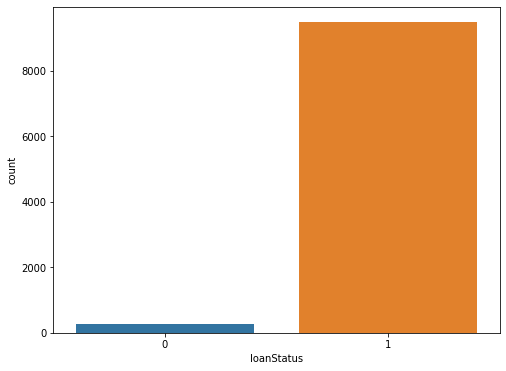

In [10]:
# Lets Visualize our Y Label
plt.figure(figsize=(8,6))
sns.countplot(new_loan_df['loanStatus']);

print('The percentage of 0 class : %.2f' % (new_loan_df['loanStatus'].value_counts()[0] / len(new_loan_df)))
print('The percentage of 1 class : %.2f' % (new_loan_df['loanStatus'].value_counts()[1] / len(new_loan_df)))

From this information, we understood that our Y label is severely imbalanced. 

In [104]:
new_loan_df.drop(
 ['.underwritingdataclarity.clearfraud.clearfraudindicator.inquiryageyoungerthanssnissuedate',
 '.underwritingdataclarity.clearfraud.clearfraudindicator.onfileaddresscautious',
 '.underwritingdataclarity.clearfraud.clearfraudindicator.onfileaddresshighrisk',
 '.underwritingdataclarity.clearfraud.clearfraudindicator.ssnreportedmorefrequentlyforanother',
 '.underwritingdataclarity.clearfraud.clearfraudindicator.inputssnissuedatecannotbeverified',
 '.underwritingdataclarity.clearfraud.clearfraudindicator.inquiryaddresscautious',
 '.underwritingdataclarity.clearfraud.clearfraudindicator.creditestablishedpriortossnissuedate',
 '.underwritingdataclarity.clearfraud.clearfraudindicator.inquiryaddresshighrisk',
 '.underwritingdataclarity.clearfraud.clearfraudindicator.highprobabilityssnbelongstoanother']
                 ,axis=1,inplace=True)

**Correlation Matrix with Heatmap**

In [105]:
# Lets check the correlation of our data using the Heat Map
def heat_map(data):
    plt.figure(figsize=(50,50))
    plt.title('Correlation Heatmap', fontsize = 50)
    a = sns.heatmap(data.corr(), square=True, annot=True, fmt='.2f',cmap='viridis', linecolor='black',annot_kws={'size': 30})
    a.set_xticklabels(a.get_xticklabels(), fontsize = 30)
    a.set_yticklabels(a.get_yticklabels(), fontsize = 30)           
    plt.show() 

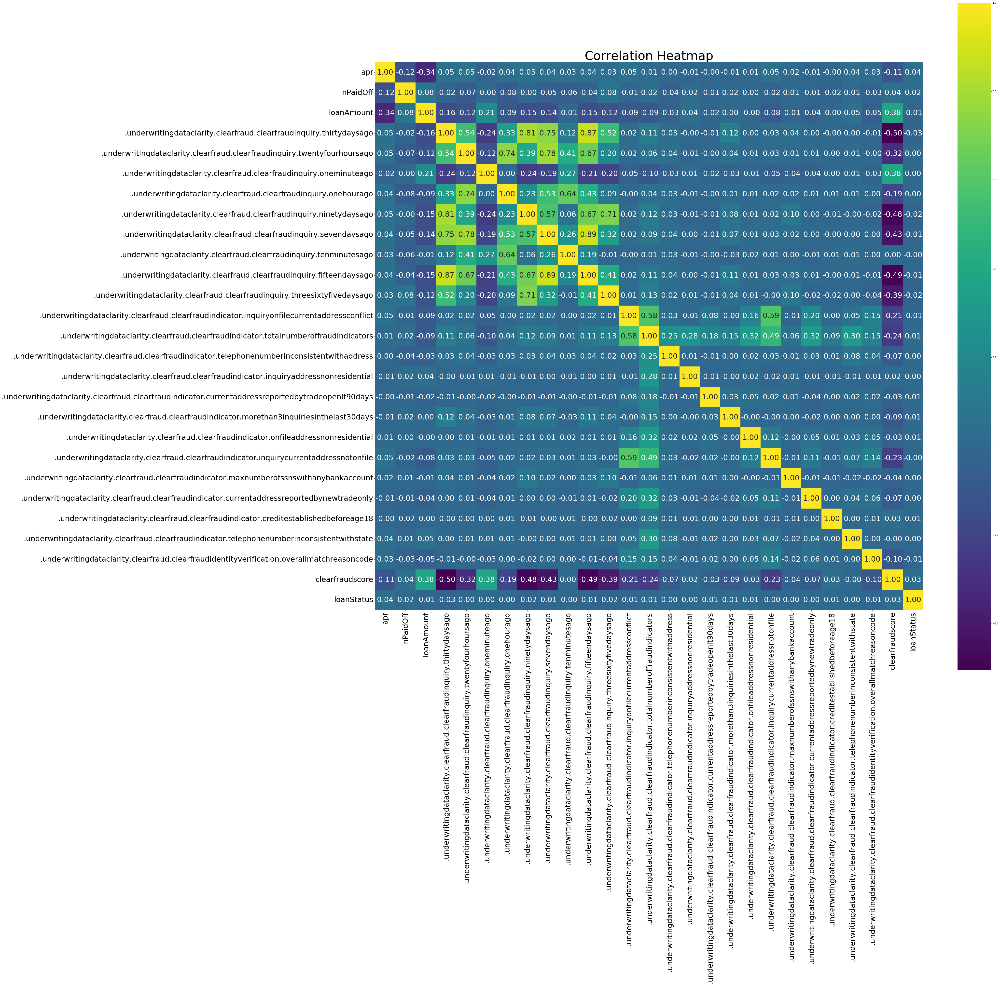

In [106]:
# Correlation between Pay Frequency 
heat_map(new_loan_df)

From the analysis above the features:
    1. .underwritingdataclarity.clearfraud.clearfraudinquiry.fifteendaysago
    2. .underwritingdataclarity.clearfraud.clearfraudinquiry.sevendaysago
    3. .underwritingdataclarity.clearfraud.clearfraudinquiry.thirtydaysago
has a correlation of above the 80 Percentile of 1, hence we will remove these features causing multicollinearity between each other. As these columns are 80% or above similar to each other we might not get much information from them if we feed it to our model.

In [107]:
# Dropping multicollinearity columns
new_loan_df.drop(
    ['.underwritingdataclarity.clearfraud.clearfraudinquiry.fifteendaysago',
    '.underwritingdataclarity.clearfraud.clearfraudinquiry.sevendaysago',
    '.underwritingdataclarity.clearfraud.clearfraudinquiry.thirtydaysago']
                 ,axis=1,inplace=True)

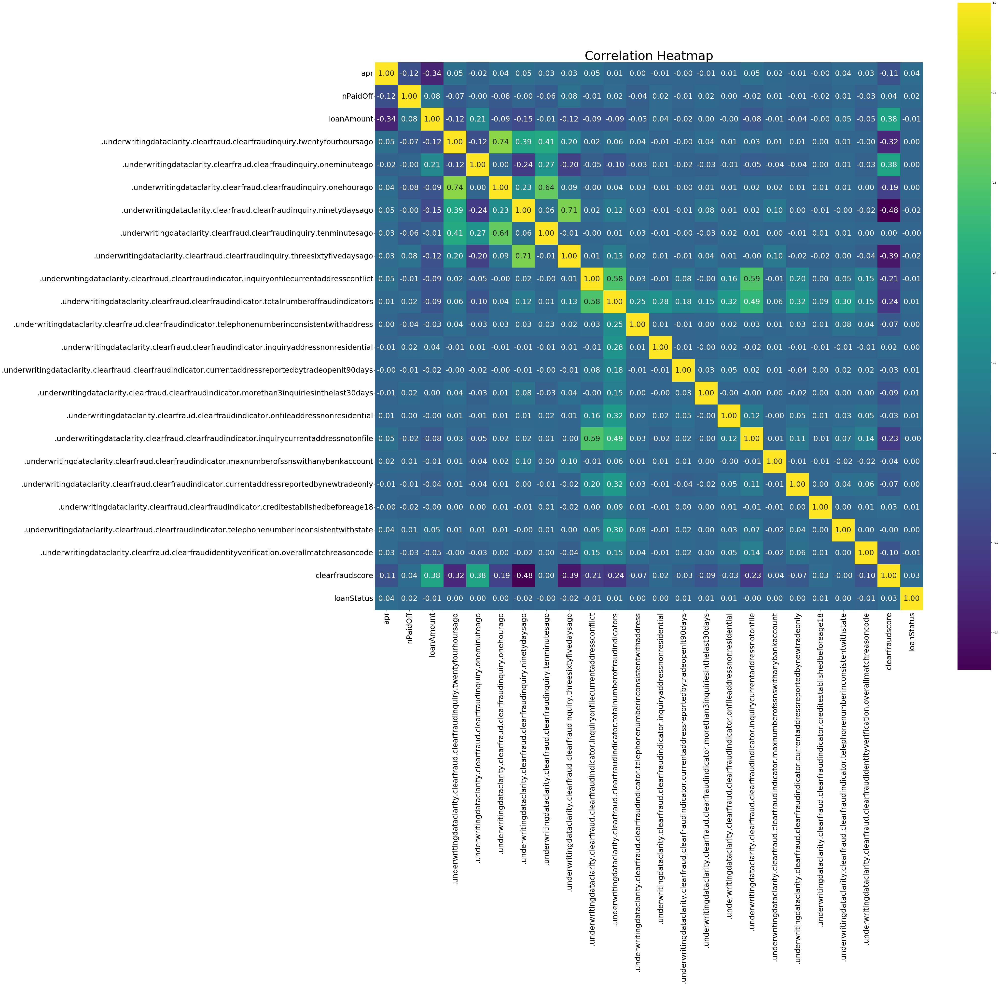

In [108]:
# Lets check the correlation between out variables in our new dataset
heat_map(new_loan_df)

In [109]:
# Saving our new dataset as the Training Dataset 
new_loan_df.to_csv('Training_loan_data.csv')

With the information above, I believe our dataset is ready to be trained.

### Model Creation 
**Explanation of the Techniques and Algorithms used**

For our model training we will do trial and error with the following Techniques:

    SMOTE (Synthetic Minority Oversampling Technique)
    
The Classification Supervised Algorithm used for the dataset that applied the two techniques above
    1. Logistic Regression
    2. K-Nearest Neighbours 
    3. Support Vector Machines 
    4. Decision Tree
    5. Random Forrest
We will then use K-fold for validation and the Confusion Matrix / AUC for evaluation. AUC is used because our data is severely imbalanced and it is a good indicator for distinguishing between the positive and negative classes.

Accuracy is not a good indicator in this scenario where data are imbalanced. The Model will predict a high accuracy but will be biased to only one side of the prediction. 

In [122]:
training_df['loanStatus'].value_counts()

1    9475
0     275
Name: loanStatus, dtype: int64

### Data Transformation & Splitting 


In [3]:
# Loading our Dataset 
training_df = pd.read_csv('data/Training_loan_data_testing.csv')

In [4]:
# Creating our X & Y variable 
X = training_df.iloc[:,0:]
y = training_df['loanStatus']
X_kfold = X.copy()

### Model Training Non-Smote

In [1]:
# Import Libraries 
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import train_test_split
from sklearn import metrics
import pickle

In [5]:
# Splitting our data to train / test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, stratify= y) # Use stratify here to solve imbalance issue
    
# Normalzing and Feature Scaling our data for training 
from sklearn.preprocessing import StandardScaler
sc_X = StandardScaler()
X_train = sc_X.fit_transform(X_train)
X_test = sc_X.transform(X_test)
X_kfold = sc_X.fit_transform(X_kfold)

Since our minority class in our Y label is only 2.8% of our data, we use 'Stratify' to make sure the proportion of values split is the same as the proportion of values provided to the Stratify parameter.

In [6]:
# Writing a function to define all our Classification Algorithmns
def classification(algorithm, name):
    classifier = algorithm
    classifier.fit(X_train, y_train)
    
    # Predicting the Test set results
    y_pred = classifier.predict(X_test)
    
    # Classification Report
    print('Classification Report:\n',classification_report(y_test,y_pred))
    # Confusion Matrix
    print('Confusion Matrix:\n', confusion_matrix(y_test, y_pred))
    # Calculate AUC
    auc = metrics.roc_auc_score(y_test, y_pred)
    print('AUC: ', auc)
    print('='*100)
   
    # We will only be saving models that are trained without SMOTE
    model_name = name
    pickle.dump(classifier, open(model_name, 'wb'))

In [7]:
# Classifiers
lr = LogisticRegression(random_state = 0)
knn = KNeighborsClassifier(n_neighbors = 5, metric = 'minkowski', p = 2)
svm = SVC(kernel = 'linear', random_state = 0)
rf = RandomForestClassifier(n_estimators = 10, criterion = 'entropy', random_state = 0)
dt = DecisionTreeClassifier(criterion = 'entropy', random_state = 0)
lists = [lr, knn, svm, rf, dt]
algo_dict = {
    'Logistic Regression': lr, 'K-Nearest Neighbour': knn, 'Support Vector Machine': svm,
    'Random Forest': rf, 'Decision Tree': dt
}
k_algo_dict = {
    'Logistic Regression K_fold': lr, 'K-Nearest Neighbour K_fold': knn, 
    'Support Vector Machine K_fold': svm,
    'Random Forest K_fold': rf, 'Decision Tree K_fold': dt
}

In [8]:
# Getting each Algorithmns Confusion Matrix and Classification Report
for name, algos in algo_dict.items():
    print('')
    print(name)
    classification(algos, name)


Logistic Regression
Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00        82
           1       1.00      1.00      1.00      2843

    accuracy                           1.00      2925
   macro avg       1.00      1.00      1.00      2925
weighted avg       1.00      1.00      1.00      2925

Confusion Matrix:
 [[  82    0]
 [   0 2843]]
AUC:  1.0

K-Nearest Neighbour
Classification Report:
               precision    recall  f1-score   support

           0       1.00      0.99      0.99        82
           1       1.00      1.00      1.00      2843

    accuracy                           1.00      2925
   macro avg       1.00      0.99      1.00      2925
weighted avg       1.00      1.00      1.00      2925

Confusion Matrix:
 [[  81    1]
 [   0 2843]]
AUC:  0.9939024390243902

Support Vector Machine
Classification Report:
               precision    recall  f1-score   support

           0       1.00   

### Model Evaluation K-FOLD Evaluation Non-Smote

In [212]:
# K-Fold Cross Validation
kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=1)
for train_ix, test_ix in kfold.split(X_kfold, y):
    train_x, test_x, = X_kfold[train_ix] , X_kfold[test_ix] 
    train_y, test_y = y[train_ix], y[test_ix]

# Writing a function to define all our Classification Algorithmns
def k_classification(algorithm):
    classifier = algorithm
    classifier.fit(train_x, train_y)

    # Predict the labels of the test set samples
    k_fold_ypred = classifier.predict(test_x)
    # Classification Report
    print('Classification Report:\n',classification_report(test_y, k_fold_ypred))
    # Confusion Matrix
    print('Confusion Matrix:\n', confusion_matrix(test_y, k_fold_ypred))
    # Calculate AUC
    auc = metrics.roc_auc_score(test_y, k_fold_ypred)
    print('AUC: ', auc)
    print('='*100)

In [213]:
# Getting each Algorithmns Confusion Matrix and Classification Report for K-fold
for name, algos in k_algo_dict.items():
    print('')
    print(name)
    k_classification(algos)


Logistic Regression K_fold
Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00        55
           1       1.00      1.00      1.00      1895

    accuracy                           1.00      1950
   macro avg       1.00      1.00      1.00      1950
weighted avg       1.00      1.00      1.00      1950

Confusion Matrix:
 [[  55    0]
 [   0 1895]]
AUC:  1.0

K-Nearest Neighbour K_fold
Classification Report:
               precision    recall  f1-score   support

           0       1.00      0.98      0.99        55
           1       1.00      1.00      1.00      1895

    accuracy                           1.00      1950
   macro avg       1.00      0.99      1.00      1950
weighted avg       1.00      1.00      1.00      1950

Confusion Matrix:
 [[  54    1]
 [   0 1895]]
AUC:  0.9909090909090909

Support Vector Machine K_fold
Classification Report:
               precision    recall  f1-score   support

     

### Model Training Smote

C:\Users\Boss\anaconda3\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


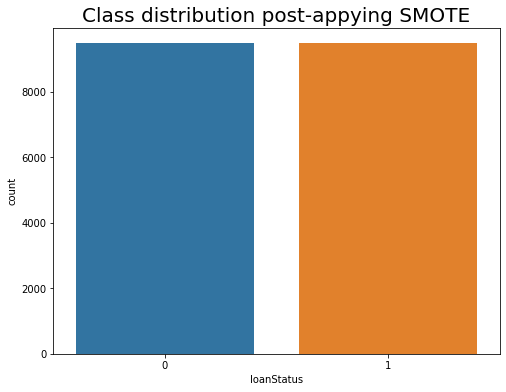

In [142]:
from imblearn.over_sampling import SMOTE
# SMOTE
X_resampled, y_resampled = SMOTE().fit_resample(X, y)
# Lets visualize our data after 
plt.figure(figsize=(8,6))
plt.title('Class distribution post-appying SMOTE', fontsize = 20)
x = sns.countplot(y_resampled);

From here we created synthetic data points that equalize our imbalance Y label.

In [195]:
# Splitting training set for SMOTE
SX_train, SX_test, sy_train, sy_test = train_test_split(X_resampled, y_resampled, test_size = 0.3, random_state=0)
SX_kfold = X_resampled.copy()
# Normalzing and Feature Scaling our data for training 
SX_train = sc_X.fit_transform(SX_train)
SX_test = sc_X.transform(SX_test)
SX_kfold = sc_X.fit_transform(SX_kfold)

In [216]:
def s_classification(algorithm):
    classifier = algorithm
    classifier.fit(SX_train, sy_train)
    
    # Predicting the Test set results
    sy_pred = classifier.predict(SX_test)
    
    # Classification Report
    print('Classification Report:\n',classification_report(sy_test,sy_pred))
    # Confusion Matrix
    print('Confusion Matrix:\n', confusion_matrix(sy_test, sy_pred))
    # Calculate AUC
    auc = metrics.roc_auc_score(sy_test, sy_pred)
    print('AUC: ', auc)
    print('='*100)

In [217]:
# Getting each Algorithmns Confusion Matrix and Classification Report for SMOTE
for name, algos in algo_dict.items():
    print('')
    print(name)
    s_classification(algos)


Logistic Regression
Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      2898
           1       1.00      1.00      1.00      2787

    accuracy                           1.00      5685
   macro avg       1.00      1.00      1.00      5685
weighted avg       1.00      1.00      1.00      5685

Confusion Matrix:
 [[2898    0]
 [   0 2787]]
AUC:  1.0

K-Nearest Neighbour
Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      2898
           1       1.00      1.00      1.00      2787

    accuracy                           1.00      5685
   macro avg       1.00      1.00      1.00      5685
weighted avg       1.00      1.00      1.00      5685

Confusion Matrix:
 [[2897    1]
 [   6 2781]]
AUC:  0.9987510409539707

Support Vector Machine
Classification Report:
               precision    recall  f1-score   support

           0       1.00   

### Model Evaluation K-FOLD Evaluation Smote

In [218]:
# K-Fold Cross Validation Smote
s_kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=1)
for train_six, test_six in s_kfold.split(SX_kfold, y_resampled):
    train_sx, test_sx, = SX_kfold[train_six] , SX_kfold[test_six] 
    train_sy, test_sy = y_resampled[train_six], y_resampled[test_six]

# Writing a function to define all our Classification Algorithmns
def sk_classification(algorithm):
    classifier = algorithm
    classifier.fit(train_sx, train_sy)

    # Predict the labels of the test set samples
    sk_fold_ypred = classifier.predict(test_sx)
    # Classification Report
    print('Classification Report:\n',classification_report(test_sy, sk_fold_ypred))
    # Confusion Matrix
    print('Confusion Matrix:\n', confusion_matrix(test_sy, sk_fold_ypred))
    # Calculate AUC
    auc = metrics.roc_auc_score(test_sy, sk_fold_ypred)
    print('AUC: ', auc)
    print('='*100)

In [219]:
# Getting each Algorithmns Confusion Matrix and Classification Report for SMOTE
for name, algos in k_algo_dict.items():
    print('')
    print(name)
    sk_classification(algos)


Logistic Regression K_fold
Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      1895
           1       1.00      1.00      1.00      1895

    accuracy                           1.00      3790
   macro avg       1.00      1.00      1.00      3790
weighted avg       1.00      1.00      1.00      3790

Confusion Matrix:
 [[1895    0]
 [   0 1895]]
AUC:  1.0

K-Nearest Neighbour K_fold
Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      1895
           1       1.00      1.00      1.00      1895

    accuracy                           1.00      3790
   macro avg       1.00      1.00      1.00      3790
weighted avg       1.00      1.00      1.00      3790

Confusion Matrix:
 [[1895    0]
 [   3 1892]]
AUC:  0.9992084432717678

Support Vector Machine K_fold
Classification Report:
               precision    recall  f1-score   support

     

## ML Model Impact On Business Objective Discussion (Summary)
Overall all our machine algorithms did a great job in predicting the Confusion Matrix with most models having a perfect score for both the True Positive and False Positive values. To validate our prediction, we split the data into 5 folds to test whether it will produce the same result and it did. For our final evaluation we used AUC to check how well our model can distinguish between positive and negative classes, since the AUC score is 1 for most models, our classifier can perfectly distinguish between all Positive and Negative classes.

With the saved models we can test it on real-life data with similar attributes to check if the result would be the same as our trained model. From this project, we are now able to know the chance of default for our applicants and could take the steps to mitigate losses. The next step is to experiment and see WHY our applicants are defaulting on their loans and adjust our product to better suit our customers.

## Further Improvement
     1.	Further clarifying the meaning of each row in the Description section of the underwriting dictionary 
    2. Understanding how the Credit Score is calculated and the features used to calculate it. 
    3. Collect more data on applicants who are funded 
    4. Try different method/techniques eg: "Class Weights" 
    5. Use different Feature selection methods 
    6. Compare uses cases from different default loan models. 


## Appendix
>### Tools / Libraries / Technique Used

>| Job |  Tools |Description|
| --- | --- | --- |
| Data Engineering | Pandas  | Pandas is a software library written for the Python programming language for data manipulation and analysis |
| Visualization | Seaborn  | Seaborn is a Python data visualization library based on matplotlib.  |
| Techniques for Feature Selection and solving imbalance data issues  | Filter method / SMOTE | Features were filtred based on Constant/Quasi Features and Imbalance Y label was solve by creating a Synthetic examples of the data |
| Machine Learning | Scikit Learn | Scikit-learn is a free software machine learning library for the Python programming language. |


>### Data Used
>| File Name | File Type |Description|
| --- | --- | --- |
| Loan | csv | Created our Y label based on funded applicant and loanstatus |
| Clarity_Underwritting_variables | csv | Used most the columns here as Features(X label) for our model creation|
| MoneyLion Data Scientist Assessment Data Dictionary | pdf | Used to understand the meaning of each column in the provided csv files |